colorbar [ERROR]: Cannot access custom file in -B string x-component label "Elevation (m)"
colorbar [ERROR]: Cannot access custom file in -B string y-component label "Elevation (m)"
colorbar [ERROR]: Cannot access custom file in -B string x-component label "Elevation (m)"
colorbar [ERROR]: Cannot access custom file in -B string y-component label "Elevation (m)"


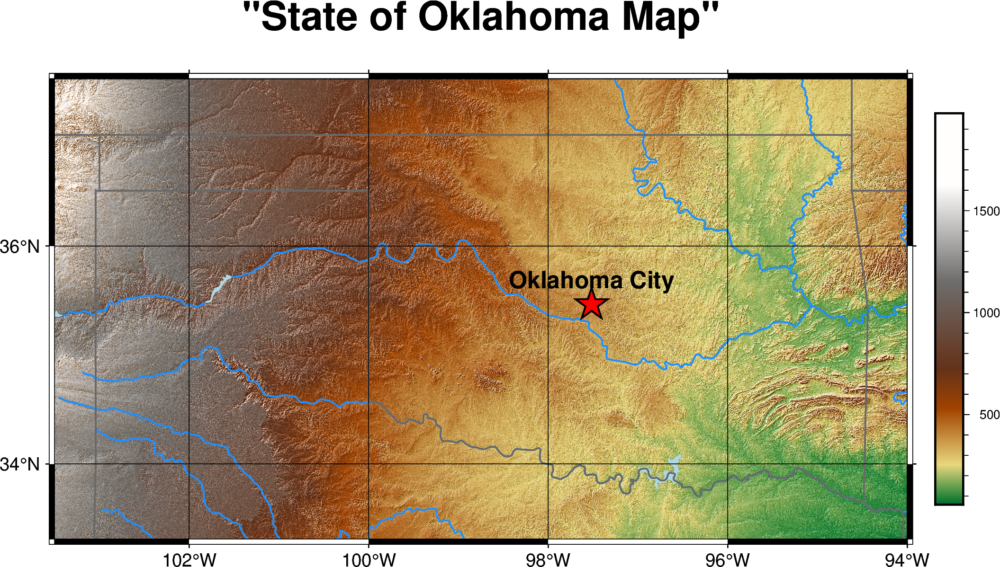

In [2]:
import pygmt

# Set the output file name
output_file = "oklahoma_state_map.png"

# Define the region for Oklahoma (West/East/South/North)
# Includes a small buffer for better visualization
region = [-103.5, -94.0, 33.3, 37.5]

# Define the projection (Mercator, 6 inches wide)
projection = "M6i"

# Create the figure
fig = pygmt.Figure()

# 1. Load and plot high-resolution topography (3 arc-second resolution)
# Note: This will download data from GMT servers on the first run
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=region)

# 2. Plot the relief image using a standard Earth color palette ('geo')
# 'shading=True' adds a hillshade effect for better 3D appearance
fig.grdimage(grid=grid, projection=projection, cmap="geo", shading=True)

# 3. Add Coastlines, Rivers, Lakes, and State/National Boundaries
# 'borders' levels: 1 = National, 2 = State/Provincial
fig.coast(
    shorelines="1/0.5p,black",     # Coastlines (not applicable for landlocked OK but good practice)
    rivers="a/0.8p,dodgerblue",    # 'a' plots all rivers and canals
    lakes="lightblue",             # Fill lakes with light blue
    water="lightblue",             # Fill oceans/seas
    borders=["1/1p,black", "2/0.7p,dimgray"], # 1: National border, 2: State border
    frame=["ag", 'WSne+t"State of Oklahoma Map"'] # Add grid and title
)

# 4. Plot Oklahoma City (OKC) location
# Coordinates: 35.4676° N, 97.5164° W
okc_lon, okc_lat = -97.5164, 35.4676

fig.plot(
    x=okc_lon,
    y=okc_lat,
    style="a0.6c",      # 'a' is for star, '0.6c' is the size (0.6 cm)
    fill="red",         # Red star for the capital
    pen="0.8p,black",   # Black outline for the star
)

# 5. Add a label for Oklahoma City
fig.text(
    x=okc_lon,
    y=okc_lat + 0.15,   # Offset text slightly above the point
    text="Oklahoma City",
    font="12p,Helvetica-Bold,black",
    justify="CB"        # Center-Bottom justification
)

# 6. Add a color bar for topography
fig.colorbar(
    frame=["af", 'clabel "Elevation (m)"'],
    position="JMR+o0.5c/0c+w7c/0.5c" # Positioned on the right
)

# Save the final map
fig.savefig(output_file)

# Show the plot in the console/notebook
fig.show()

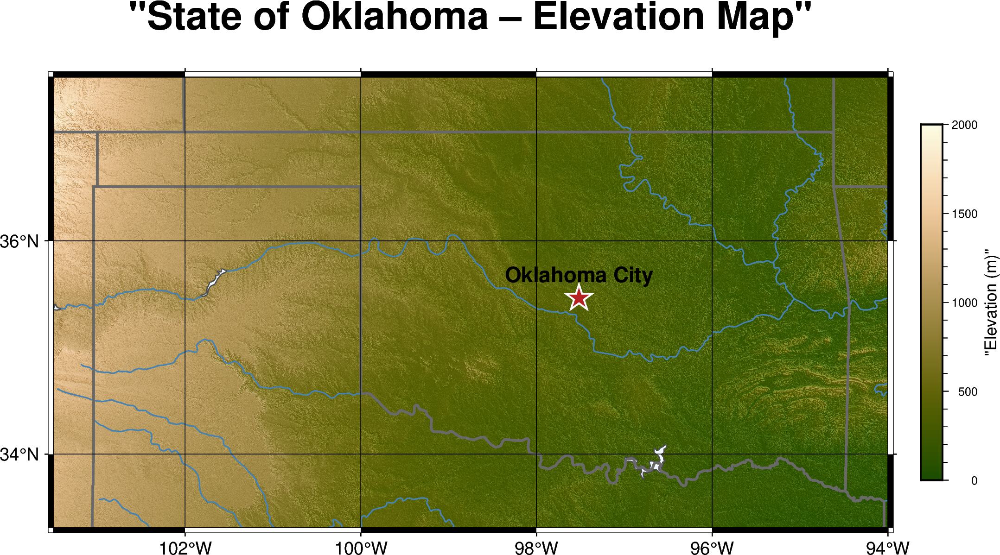

In [3]:
import pygmt
import numpy as np

# -----------------------------
# Output file
# -----------------------------
output_file = "oklahoma_state_elevation_muted.png"

# -----------------------------
# Region: Oklahoma + buffer
# -----------------------------
region = [-103.5, -94.0, 33.3, 37.5]

# Projection
projection = "M6i"

# -----------------------------
# Create figure
# -----------------------------
fig = pygmt.Figure()

# -----------------------------
# Load high-resolution topography
# -----------------------------
grid = pygmt.datasets.load_earth_relief(
    resolution="03s",
    region=region
)

# -----------------------------
# Compute min / max elevation
# -----------------------------
zmin = float(grid.min())
zmax = float(grid.max())

# Round nicely for CPT
zmin = np.floor(zmin / 100) * 100
zmax = np.ceil(zmax / 100) * 100

# -----------------------------
# Create a muted CPT
# -----------------------------
# Using a softer, elegant terrain palette
pygmt.makecpt(
    cmap="oleron",     # muted earth-tone palette
    series=[zmin, zmax, 50],
    continuous=True
)

# -----------------------------
# Plot topography with gentle shading
# -----------------------------
fig.grdimage(
    grid=grid,
    region=region,
    projection=projection,
    shading="+a45+nt0.4",  # subtle hillshade
)

# -----------------------------
# Add boundaries, rivers, lakes
# -----------------------------
fig.coast(
    region=region,
    projection=projection,
    borders=[
        "1/1p,black",        # National border
        "2/1.2p,dimgray"     # State boundaries (emphasized)
    ],
    rivers="a/0.6p,steelblue",
    lakes="aliceblue",
    shorelines="0.5p,gray30",
    frame=["ag", 'WSne+t"State of Oklahoma – Elevation Map"']
)

# -----------------------------
# Oklahoma City marker
# -----------------------------
okc_lon, okc_lat = -97.5164, 35.4676

fig.plot(
    x=okc_lon,
    y=okc_lat,
    style="a0.5c",
    fill="firebrick",
    pen="0.8p,white"
)

fig.text(
    x=okc_lon,
    y=okc_lat + 0.15,
    text="Oklahoma City",
    font="11p,Helvetica-Bold,black",
    justify="CB"
)

# -----------------------------
# Colorbar
# -----------------------------
fig.colorbar(
    frame=["af", 'x+l"Elevation (m)"'],
    position="JMR+o0.6c/0c+w6.5c/0.4c"
)

# -----------------------------
# Save figure (publication-ready)
# -----------------------------
fig.savefig(
    output_file,
    dpi=300
)

fig.show()


In [ ]:
import pygmt
import numpy as np

# -----------------------------
# Output file
# -----------------------------
output_file = "oklahoma_state_elevation_muted.png"

# -----------------------------
# Region
# -----------------------------
region = [-103.5, -94.0, 33.3, 37.5]
projection = "M6i"

fig = pygmt.Figure()

# -----------------------------
# Load topography
# -----------------------------
grid = pygmt.datasets.load_earth_relief(
    resolution="03s",
    region=region
)

# -----------------------------
# Determine elevation range
# -----------------------------
zmin = float(grid.min())
zmax = float(grid.max())

zmin = np.floor(zmin / 100) * 100
zmax = np.ceil(zmax / 100) * 100

# -----------------------------
# Create a neutral CPT
# -----------------------------
# Gray-beige-brown, low saturation
pygmt.makecpt(
    cmap="dem2",
    series=[zmin, zmax, 50],
    continuous=True
)

# -----------------------------
# Plot relief with very subtle shading
# -----------------------------
fig.grdimage(
    grid=grid,
    region=region,
    projection=projection,
    shading="+a45+nt0.3"
)

# -----------------------------
# Boundaries and hydrography
# -----------------------------
fig.coast(
    region=region,
    projection=projection,
    borders=[
        "1/2p,black",        # National
        "2/2p,white"     # State boundaries (clear but not dominant)
    ],
    rivers="a/0.5p,steelblue3",
    lakes="aliceblue",
    shorelines="0.5p,gray40",
    frame=["ag", 'WSne+t"State of Oklahoma — Elevation"']
)

# -----------------------------
# Oklahoma City
# -----------------------------
okc_lon, okc_lat = -97.5164, 35.4676

fig.plot(
    x=okc_lon,
    y=okc_lat,
    style="a0.45c",
    fill="black",
    pen="0.6p,white"
)

fig.text(
    x=okc_lon,
    y=okc_lat + 0.15,
    text="Oklahoma City",
    font="10.5p,Helvetica-Bold,black",
    justify="CB"
)

# -----------------------------
# Colorbar
# -----------------------------
fig.colorbar(
    frame=["af", 'x+l"Elevation (m)"'],
    position="JMR+o0.5c/0c+w6c/0.4c"
)

# -----------------------------
# Save output
# -----------------------------
fig.savefig(output_file, dpi=300)
fig.show()
